# Accessing WEP data from 20230310 AuxTel Observing

Author: Bryce Kalmbach

Date: 03-29-2023

Software Versions:

`lsst_distrib`: `w_2023_10`

`ts_wep`: 6.0.0

This notebook shows how to run the WEP pipeline on AuxTel data and save the output in the butler repository.

## Logistics

### Additional required packages to run pipeline

This notebook requires the following packages to be installed and set up in your environment if you wish to run the pipeline tasks yourself. If you are just interested in analyzing the output this install is not necessary.

* `ts_wep`: Wavefront Estimation Pipeline [(Github Repo with install instructions)](https://github.com/lsst-ts/ts_wep)

### Where to run this notebook

This notebook is intended to be run on the [Rubin US Data Facility (USDF)](https://usdf-rsp.slac.stanford.edu/). All the data is available at the USDF.

In [1]:
from lsst.daf.butler import Butler
import matplotlib as mpl
import numpy as np
import matplotlib.pyplot as plt
from astropy.visualization import ZScaleInterval
%matplotlib inline

## Get AuxTel raw data

Get the latest AuxTel data found in `/repo/embargo`

In [2]:
repo_dir = '/sdf/data/rubin/repo/embargo/'

In [3]:
butler = Butler(repo_dir)

### Find the data.

Our data for the night consisted of the following tests ([Observation Planning Document](https://confluence.lsstcorp.org/pages/viewpage.action?pageId=214140793), [Night Log](https://confluence.lsstcorp.org/display/LSSTCOM/2023-03-10+AuxTel+Night+Log), [RubinTV](https://roundtable.lsst.codes/rubintv/summit/auxtel/historical/2023-03-10)):

| Test | Prefix in Observation Reason Metadata | Sequence Numbers | Analysis JIRA Ticket |
| :--: | :--: | :--: | :--: |
| Sensitivity Matrix Field 1, x/y offsets | intra/extra_aos_sm_offset | 33-52 | [SITCOM-718](https://jira.lsstcorp.org/browse/SITCOM-718) |
| Sensitivity Matrix Field 1, rx/ry offsets | intra/extra_aos_pointing_offset | 53-67 | [SITCOM-718](https://jira.lsstcorp.org/browse/SITCOM-718) |
| Sensitivity Matrix Field 2, x/y, rx/ry, z, m1 offsets | intra/extra_aos_sm_offset | 71-211 | [SITCOM-718](https://jira.lsstcorp.org/browse/SITCOM-718) |
| Exposure Time | intra/extra_aos_exposure_time | 215-228 | [SITCOM-719](https://jira.lsstcorp.org/browse/SITCOM-719) |
| Double Stars Field 1 | intra/extra_aos_double_stars_dun_149 | 248-255 | [SITCOM-721](https://jira.lsstcorp.org/browse/SITCOM-721) |
| Double Stars Field 1 | intra/extra_aos_double_stars_hj_561 | 256-259 | [SITCOM-721](https://jira.lsstcorp.org/browse/SITCOM-721) |
| Giant Donuts 4mm Defocus | intra/extra_aos_giant_donut_hj_561_dz_4mm | 260-261 | [SITCOM-723](https://jira.lsstcorp.org/browse/SITCOM-723) |
| Giant Donuts 6mm Defocus | intra/extra_aos_giant_donut_hj_561_dz_6mm | 262-263 | [SITCOM-723](https://jira.lsstcorp.org/browse/SITCOM-723) |

The data has been processed with a default `ts_wep` configuration and is accessible in two different collections:
* `u/brycek/latiss_wep_test/run_all`
    * This collection has all of the pairs of data run with the `ts_wep` pipeline using only the brightest source in the image.
* `u/brycek/latiss_wep_test/run_all_full_catalog`
    * This collection is the same as above except the limit of only using a single source is removed and all sources identified by `GenerateDonutDirectDetectTask` 
      are included in the donut catalog and subsequent donut stamps and Zernike estimates.
      
The configuration settings for the pipeline tasks are all accessible through the butler as datasets with the name `taskName_config` (e.g., `butler.get(calcZernikesTask_config...)`).

When processing the data we took the data and paired up extra and intra-focal images with the following code:

In [4]:
output_collection = 'u/brycek/latiss_wep_test/run_all_full_catalog'
butler = Butler(
    "/repo/embargo",
    collections=[output_collection],
    instrument='LATISS'
)


records = list(
    butler.registry.queryDimensionRecords(
        "exposure",
        where="exposure.observation_type='cwfs' and exposure.day_obs=20230310"
    )
)
records.sort(key=lambda record: (record.day_obs, record.seq_num))

# Loop through and make pairs where 1st exposure is intra and second exposure is extra and have same group_id
# Save record information for each pair and sequence numbers for easy location later.
pairs = []
seq_nums = []
for record0, record1 in zip(records[:-1], records[1:]):
    if (
        record0.observation_reason.startswith('intra') and
        record1.observation_reason.startswith('extra') and
        record0.group_id == record1.group_id and
        not record0.physical_filter.startswith("empty")
    ):
        pairs.append((record0, record1))
        seq_nums.append(record0.seq_num)
seq_nums = np.array(seq_nums)

Here we create the full dataIds for the processed data by adding the detector and visit information into the exposure dataIds.

In [5]:
from copy import copy
dataIdPairs = []
for pair in pairs:
    dataId_intra = dict(pair[0].dataId)
    dataId_intra['visit'] = pair[0].dataId['exposure']
    dataId_intra['detector'] = 0
    
    dataId_extra = dict(pair[1].dataId)
    dataId_extra['visit'] = pair[1].dataId['exposure']
    dataId_extra['detector'] = 0
    
    dataIdPairs.append([dataId_intra, dataId_extra])
    

### Look at output stored in butler

In [6]:
# Reload butler to get new collection
butler = Butler(repo_dir)

In [7]:
# Pick the first of the exposure time fields since these have lots of stars
pair_idx = np.where(seq_nums == 215)[0][0]

In [8]:
# To make things clearer rename these data ids
data_id_intra = dataIdPairs[pair_idx][0]
data_id_extra = dataIdPairs[pair_idx][1]

### Load the postISR images and the `donutCatalog`

The `donutCatalog` is what we call the catalog we used to store the donut sources used to estimate the Zernikes in a run of the WEP pipeline. The sources in our `donutCatalog` are sorted from brightest to faintest based upon the aperture flux measured during `GenerateDonutDirectDetectTask`.

In [9]:
rawExtra = butler.get('raw', dataId=data_id_extra, collections=output_collection)
rawIntra = butler.get('raw', dataId=data_id_intra, collections=output_collection)

In [10]:
postIsrExtra = butler.get('postISRCCD', dataId=data_id_extra, collections=output_collection)
postIsrIntra = butler.get('postISRCCD', dataId=data_id_intra, collections=output_collection)

In [11]:
donutCatExtra = butler.get('donutCatalog', dataId=data_id_extra, collections=output_collection)
donutCatIntra = butler.get('donutCatalog', dataId=data_id_intra, collections=output_collection)

In [12]:
donutCatExtra

,coord_ra,coord_dec,centroid_x,centroid_y,detector,source_flux,blend_centroid_x,blend_centroid_y
0,2.306812,-0.684764,1960.295481,2217.697601,RXX_S00,5.859008e+07,[],[]
1,2.305865,-0.685115,524.595723,3222.918201,RXX_S00,9.177924e+05,[],[]
2,2.306804,-0.684350,2730.773556,2665.488142,RXX_S00,6.825300e+05,[],[]
3,2.308096,-0.684773,2993.703825,337.842752,RXX_S00,5.508085e+05,[],[]
4,2.306826,-0.685286,990.732987,1645.014032,RXX_S00,3.193905e+05,[],[]
5,2.306085,-0.685327,306.660599,2678.520945,RXX_S00,1.260611e+05,[],[]
6,2.306211,-0.685161,721.311048,2670.230039,RXX_S00,1.156853e+05,[],[]
7,2.307581,-0.684790,2540.347502,1070.642990,RXX_S00,9.597980e+04,[],[]


In [13]:
donutCatIntra

,coord_ra,coord_dec,centroid_x,centroid_y,detector,source_flux,blend_centroid_x,blend_centroid_y
0,2.306814,-0.684764,1960.876413,2216.122276,RXX_S00,6.096680e+07,[],[]
1,2.305868,-0.685114,527.533542,3220.406372,RXX_S00,9.413950e+05,[],[]
2,2.306807,-0.684350,2732.518183,2663.802521,RXX_S00,7.368944e+05,[],[]
3,2.308098,-0.684772,2996.050396,339.503063,RXX_S00,6.212670e+05,[],[]
4,2.306828,-0.685284,994.549202,1645.374650,RXX_S00,3.283438e+05,[],[]
5,2.306087,-0.685326,310.287993,2679.015059,RXX_S00,1.296752e+05,[],[]
6,2.306215,-0.685160,726.905625,2668.299076,RXX_S00,1.187798e+05,[],[]
7,2.307584,-0.684788,2545.664845,1069.819330,RXX_S00,1.081159e+05,[],[]


Text(0, 0.5, 'Y Pixels')

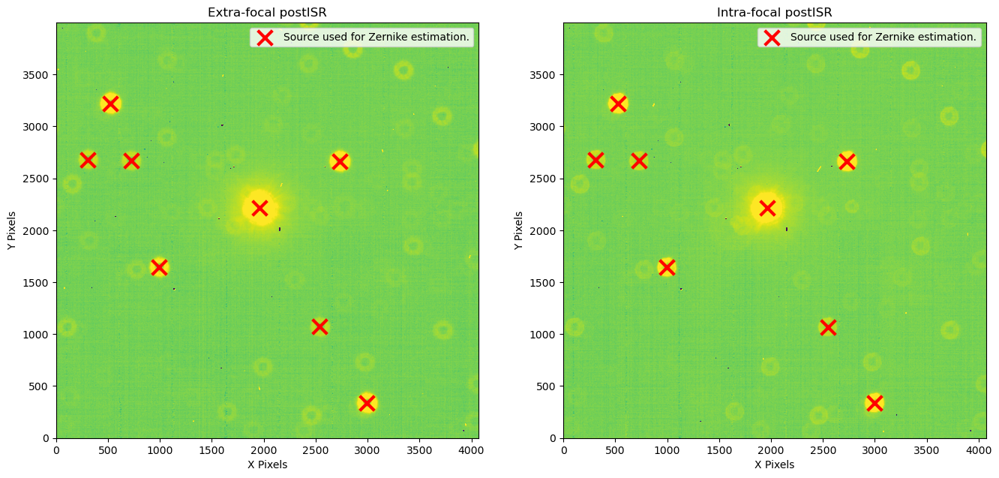

In [14]:
%matplotlib inline

fig=plt.figure(figsize=(16,8))

fig.add_subplot(1,2,1)
zscale_extra = ZScaleInterval().get_limits(postIsrExtra.image.array)
plt.imshow(postIsrExtra.image.array, norm=mpl.colors.AsinhNorm(vmin=zscale_extra[0], vmax=zscale_extra[1]), origin='lower')
plt.title('Extra-focal postISR')
plt.scatter(donutCatExtra['centroid_x'], donutCatExtra['centroid_y'], c='r', marker='x', lw=3, s=200, label="Source used for Zernike estimation.")
plt.legend()
plt.xlabel('X Pixels')
plt.ylabel('Y Pixels')

fig.add_subplot(1,2,2)
zscale_intra = ZScaleInterval().get_limits(postIsrIntra.image.array)
plt.imshow(postIsrIntra.image.array, norm=mpl.colors.AsinhNorm(vmin=zscale_intra[0], vmax=zscale_intra[1]), origin='lower')
plt.title('Intra-focal postISR')
plt.scatter(donutCatIntra['centroid_x'], donutCatIntra['centroid_y'], c='r', marker='x', lw=3, s=200, label="Source used for Zernike estimation.")
plt.legend()
plt.xlabel('X Pixels')
plt.ylabel('Y Pixels')

There are quite a few hot pixels in the current ISR set up we use. This JIRA ticket ([DM-38196](https://jira.lsstcorp.org/browse/DM-38196)) is working on fixing this.

### Load the `donutStamps`

The `donutStamps` are the postage stamp cutouts we take for each donut source and save to the butler. These stamps are then used in the final step to estimate Zernikes. Note that at this step we only use the extra-focal data id for all remaining data products. This allows us to parallelized the processing for each pair of corner wavefront sensors when running on the LSSTCam.

In [15]:
donutStampsExtra = butler.get('donutStampsExtra', dataId=data_id_extra, collections=output_collection)
donutStampsIntra = butler.get('donutStampsIntra', dataId=data_id_extra, collections=output_collection)

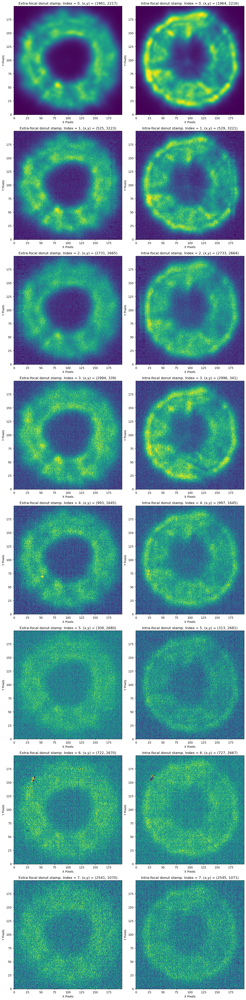

In [16]:
fig=plt.figure(figsize=(12,48))

for i in range(8):

    fig.add_subplot(8,2,2*i+1)
    zscale_extra = ZScaleInterval().get_limits(donutStampsExtra[i].stamp_im.image.array)
    plt.imshow(donutStampsExtra[i].stamp_im.image.array, vmin=zscale_extra[0], vmax=zscale_extra[1], origin='lower')
    plt.title(f'Extra-focal donut stamp. Index = {i}. (x,y) = {donutStampsExtra[i].centroid_position}')
    plt.xlabel('X Pixels')
    plt.ylabel('Y Pixels')

    fig.add_subplot(8,2,2*i+2)
    zscale_intra = ZScaleInterval().get_limits(donutStampsIntra[i].stamp_im.image.array)
    plt.imshow(donutStampsIntra[i].stamp_im.image.array, vmin=zscale_intra[0], vmax=zscale_intra[1], origin='lower')
    plt.title(f'Intra-focal donut stamp. Index = {i}. (x,y) = {donutStampsIntra[i].centroid_position}')
    plt.xlabel('X Pixels')
    plt.ylabel('Y Pixels')
    
plt.tight_layout()

### Load the Zernike output

The final Zernike output of the pipeline comes in two forms. The first is `zernikeEstimateRaw` which has all the Zernikes measured for a CCD that are output in the `donutCatalog` for that CCD. The second is `zernikeEstimateAvg` which is a clipped average of all the Zernikes from a CCD (for more information on the clipping see [this notebook on `calcZernikesTask`](https://github.com/lsst-ts/ts_analysis_notebooks/blob/develop/aos/closed_loop/calcZernikesFromDonutStamps.ipynb).

Let's load both the raw and average information here.

In [17]:
zernOutRaw = butler.get('zernikeEstimateRaw', dataId=data_id_extra, collections=output_collection)
zernOutAvg = butler.get('zernikeEstimateAvg', dataId=data_id_extra, collections=output_collection)

In [18]:
zernOutAvg

array([ 0.00539766,  0.01785023,  0.04180574, -0.02390634, -0.02356583,
        0.0117331 ,  0.02547326, -0.01806986, -0.0114081 , -0.00401376,
       -0.00076801, -0.00781314, -0.00209146,  0.0045797 ,  0.00227484,
       -0.00411732, -0.00951297, -0.0150683 ,  0.0090173 ])

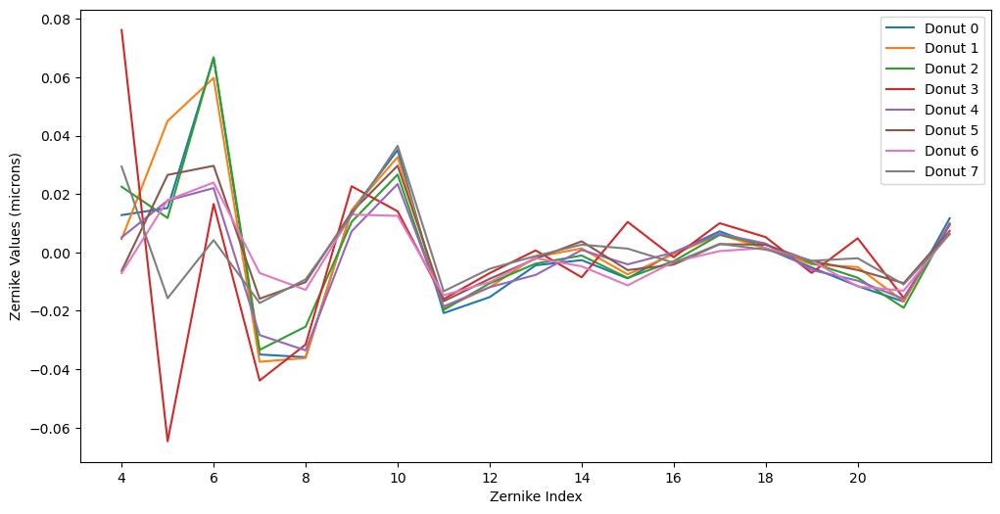

In [19]:
fig = plt.figure(figsize=(12, 6))
for i in range(len(zernOutRaw)):
    plt.plot(range(4, 23), zernOutRaw[i], label=f'Donut {i}')
plt.xticks(range(4,22)[::2])
plt.xlabel('Zernike Index')
plt.ylabel('Zernike Values (microns)')
plt.legend()

Since we used sigma clipping when running the pipeline, let's look at the returned `ZernikeEstimateAvg` versus the unclipped mean of all the donuts.

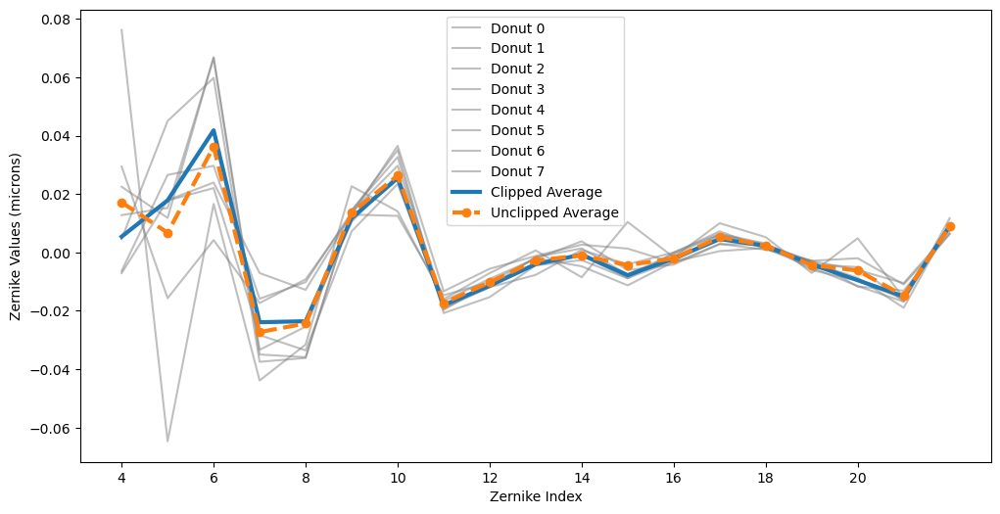

In [20]:
fig = plt.figure(figsize=(12, 6))
for i in range(len(zernOutRaw)):
    plt.plot(range(4, 23), zernOutRaw[i], label=f'Donut {i}', c='gray', alpha=0.5)
plt.plot(range(4, 23), zernOutAvg, label=f'Clipped Average', lw=3, c='C0')
plt.plot(range(4, 23), np.mean(zernOutRaw, axis=0), '--o', lw=3, c='C1', label='Unclipped Average')
plt.xticks(range(4,22)[::2])
plt.xlabel('Zernike Index')
plt.ylabel('Zernike Values (microns)')
plt.legend()

There is a difference in the two lines.
To see which were clipped we can get the flags out of the task metadata.

In [21]:
zernOutAvg_metadata = butler.get('calcZernikesTask_metadata', dataId=data_id_extra, collections=output_collection)

In [22]:
sigmaClipFlags = zernOutAvg_metadata['calcZernikesTask:combineZernikes'].arrays['combineZernikesFlags']
print(sigmaClipFlags)

[0, 1, 0, 1, 0, 0, 0, 1]


A value of **1** indicates that the Zernikes from that donut were not included in the clipped average. Let's see which ones were rejected.

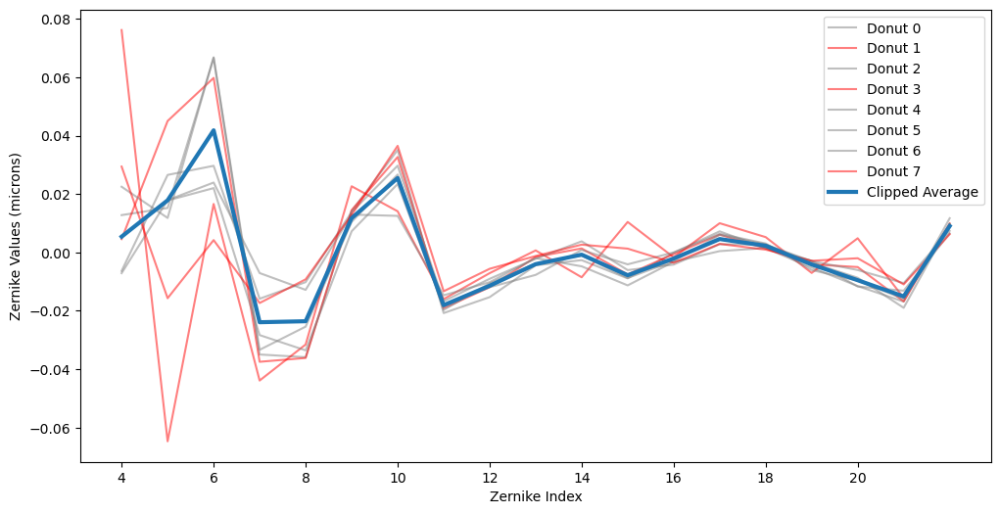

In [23]:
fig = plt.figure(figsize=(12, 6))
for i in range(len(zernOutRaw)):
    if sigmaClipFlags[i] == 0:
        plt.plot(range(4, 23), zernOutRaw[i], label=f'Donut {i}', c='gray', alpha=0.5)
    else:
        plt.plot(range(4, 23), zernOutRaw[i], label=f'Donut {i}', c='r', alpha=0.5)
plt.plot(range(4, 23), zernOutAvg, label=f'Clipped Average', lw=3, c='C0')
#plt.plot(range(4, 23), np.mean(zernOutRaw, axis=0), '--o', lw=3, c='C1', label='Unweighted Average')
plt.xticks(range(4,22)[::2])
plt.xlabel('Zernike Index')
plt.ylabel('Zernike Values (microns)')
plt.legend()

We see that three pairs of donuts were rejected. These three seemed to have especially different Z5 values than the rest. Below we plot the donuts again labelled by whether the sigma clip algorithm accepted or rejected them in the final Zernikes estimate.

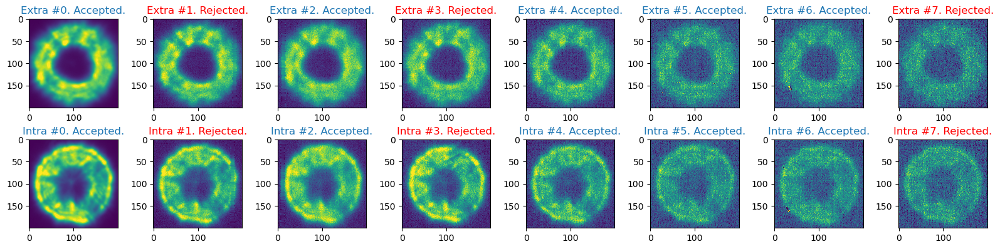

In [24]:
fig = plt.figure(figsize=(16, 4))
for i in range(8):
    if sigmaClipFlags[i] == 0:
        label = 'Accepted' 
        textColor = 'C0'
    else:
        label = 'Rejected'
        textColor = 'red'
    fig.add_subplot(2, 8, i+1)
    vmax = np.percentile(donutStampsExtra[i].stamp_im.image.array, 99)
    plt.imshow(donutStampsExtra[i].stamp_im.image.array, vmin=0, vmax=vmax)
    plt.title(f'Extra #{i}. {label}.', c=textColor)
    fig.add_subplot(2, 8, i+1+8)
    plt.imshow(donutStampsIntra[i].stamp_im.image.array, vmin=0, vmax=vmax)
    plt.title(f'Intra #{i}. {label}.', c=textColor)
plt.tight_layout()

## Fit new WCS

### Re-run donut fitting

A catalog of 8 sources could fit the WCS but to get the best fit possible we want as large a catalog as possible.
In this section we will re-run `GenerateDonutDirectDetectTask` with a lower SNR threshold.

In [25]:
# Task
from lsst.ts.wep.task import GenerateDonutDirectDetectTaskConfig, GenerateDonutDirectDetectTask

In [26]:
config = GenerateDonutDirectDetectTaskConfig()
config.measurementTask.nSigmaDetection = 2. # The default used in the full run stored in the butler is 20.
config.initialCutoutPadding = 40
# Set auxTel parameters
config.instObscuration = 0.3525
config.instFocalLength = 21.6
config.instApertureDiameter = 1.2
config.instDefocalOffset = 32.8
config.instPixelSize = 10.0e-6
config.opticalModel = 'onAxis'
# Set donut selection parameters
config.donutSelector.useCustomMagLimit = True
config.donutSelector.unblendedSeparation = 160

In [27]:
camera = butler.get('camera', {'instrument': 'LATISS'}, collections='LATISS/calib/unbounded')

In [28]:
newTask = GenerateDonutDirectDetectTask(config=config)
auxTelCat = newTask.run(postIsrExtra, camera).donutCatalog

/opt/lsst/software/stack/conda/miniconda3-py38_4.9.2/envs/lsst-scipipe-5.1.0/lib/python3.10/site-packages/astropy/units/function/logarithmic.py:65: RuntimeWarning: invalid value encountered in log10
  return dex.to(self._function_unit, np.log10(x))


Text(0, 0.5, 'Y Pixels')

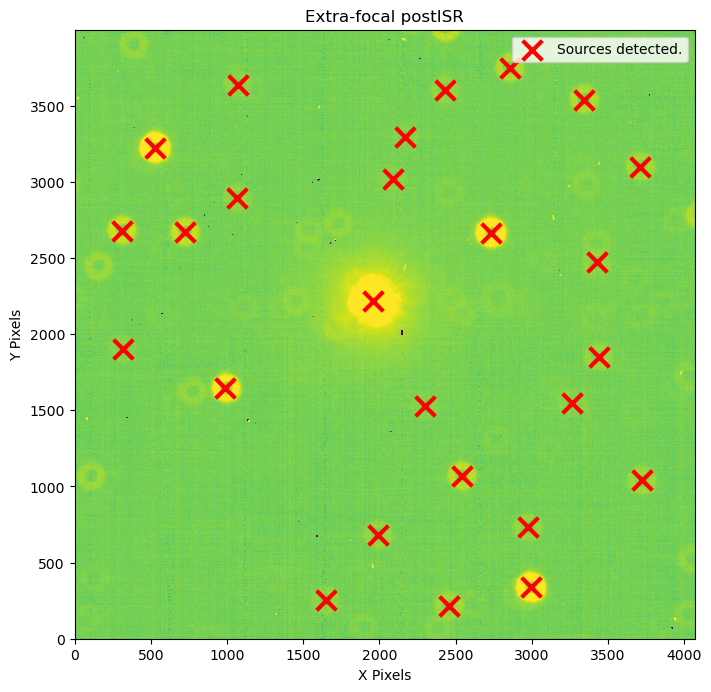

In [29]:
%matplotlib inline

fig=plt.figure(figsize=(8,8))

fig.add_subplot(1,1,1)
zscale_extra = ZScaleInterval().get_limits(postIsrExtra.image.array)
plt.imshow(postIsrExtra.image.array, norm=mpl.colors.AsinhNorm(vmin=zscale_extra[0], vmax=zscale_extra[1]), origin='lower')
plt.title('Extra-focal postISR')
plt.scatter(auxTelCat['centroid_x'], auxTelCat['centroid_y'], c='r', marker='x', lw=3, s=200, label="Sources detected.")
plt.legend()
plt.xlabel('X Pixels')
plt.ylabel('Y Pixels')

We now have a catalog of 26 sources to try and fit the WCS.

### Fit data to WCS

Next, we'll use `AstrometryTask` to fit the WCS from the new catalog. But first we will get the reference catalog shards from the butler that correspond to the area around the sky indicated by the telescope boresight information.

In [30]:
# For WCS Fitting
import lsst.geom
import lsst.afw.table as afwTable
import lsst.meas.base as measBase
from lsst.ts.wep.task import RefCatalogInterface
from lsst.meas.astrom import AstrometryTask
from lsst.meas.algorithms import MagnitudeLimit
from lsst.meas.algorithms.loadReferenceObjects import LoadReferenceObjectsConfig, ReferenceObjectLoader
from lsst.meas.algorithms.sourceSelector import ReferenceSourceSelectorConfig, ReferenceSourceSelectorTask

#### Load reference catalog shards

In [31]:
# Initialize with pointing information
info = rawExtra.getInfo()
visitInfo = info.getVisitInfo()
boresightRa, boresightDec = visitInfo.boresightRaDec
boresightRotAng = visitInfo.boresightRotAngle

refCatInterface = RefCatalogInterface(boresightRa.asDegrees(), 
                                      boresightDec.asDegrees(), 
                                      boresightRotAng.asDegrees())

In [32]:
htmIds = refCatInterface.getHtmIds()
# Use the shardIds found above to get the locations (`dataRefs`) in the butler repo for the catalog pieces we want
refCatButler = Butler('/sdf/data/rubin/repo/main/')
catalogName = 'ps1_pv3_3pi_20170110'
collections = ['refcats/DM-28636']
dataRefs, dataIds = refCatInterface.getDataRefs(htmIds, refCatButler, catalogName, collections)

In [33]:
refCatConfig = LoadReferenceObjectsConfig(anyFilterMapsToThis='r')

Create an initial reference catalog by loading all objects in a circle of radius 0.01 radians around the telescope boresight.

In [34]:
refCatLoader = ReferenceObjectLoader(dataIds, dataRefs, config=refCatConfig)
refCat = refCatLoader.loadSkyCircle(visitInfo.boresightRaDec, lsst.geom.Angle(0.01), 'r')

Trim the reference catalog with a magnitude cut.

In [35]:
# Run source selection to trim the original reference catalog by magnitude
magLimit = MagnitudeLimit()
magLimit.minimum = 4
magLimit.maximum = 16
magLimit.fluxField = 'r_flux'
srcCatConfig = ReferenceSourceSelectorConfig()
srcCatConfig.doMagLimit = True
srcCatConfig.magLimit = magLimit

In [36]:
srcCatTask = ReferenceSourceSelectorTask(config=srcCatConfig)
srcCat = srcCatTask.run(refCat.refCat).sourceCat

In [37]:
originalWcs = rawExtra.getWcs()
print(originalWcs)

FITS standard SkyWcs:
Sky Origin: (132.1790494386, -39.2338647059)
Pixel Origin: (2088, 2006)
Pixel Scale: 0.095695 arcsec/pixel


Let's look at these sources plotted with the initial WCS.

In [38]:
srcX, srcY = originalWcs.skyToPixelArray(srcCat['coord_ra'], srcCat['coord_dec'])

(0.0, 4000.0)

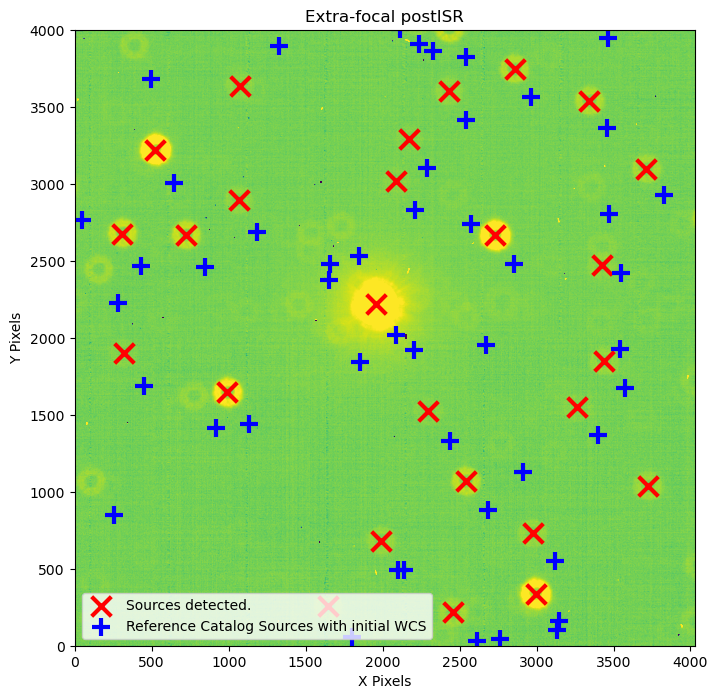

In [39]:
%matplotlib inline

fig=plt.figure(figsize=(8,8))

fig.add_subplot(1,1,1)
zscale_extra = ZScaleInterval().get_limits(postIsrExtra.image.array)
plt.imshow(postIsrExtra.image.array, norm=mpl.colors.AsinhNorm(vmin=zscale_extra[0], vmax=zscale_extra[1]), origin='lower')
plt.title('Extra-focal postISR')
plt.scatter(auxTelCat['centroid_x'], auxTelCat['centroid_y'], c='r', marker='x', lw=3, s=200, label="Sources detected.")
plt.scatter(srcX, srcY, c='blue', marker='+', s=150, lw=3, label="Reference Catalog Sources with initial WCS")
plt.legend()
plt.xlabel('X Pixels')
plt.ylabel('Y Pixels')
plt.xlim(0, 4028)
plt.ylim(0, 4000)

The initial WCS looks close but offset to the lower right for all of the sources. Let's fit a new one to do better.

#### Fit new WCS

The steps to fit a new WCS are to create and `afwTable.SourceCatalog` from our detected donut catalog and then use the original WCS in `AstrometryTask` to do the WCS fitting.

In [40]:
sourceSchema = afwTable.SourceTable.makeMinimalSchema()
measBase.SingleFrameMeasurementTask(schema=sourceSchema)  # expand the schema
sourceCat = afwTable.SourceCatalog(sourceSchema)

sourceCentroidKey = afwTable.Point2DKey(sourceSchema["slot_Centroid"])
sourceIdKey = sourceSchema["id"].asKey()
sourceRAKey = sourceSchema["coord_ra"].asKey()
sourceDecKey = sourceSchema["coord_dec"].asKey()
sourceInstFluxKey = sourceSchema["slot_ApFlux_instFlux"].asKey()
sourceInstFluxErrKey = sourceSchema["slot_ApFlux_instFluxErr"].asKey()

catalog = auxTelCat
exposure_copy = copy(rawExtra)

Nrows = len(catalog)
sourceCat.reserve(Nrows)

for i in range(Nrows):
    src = sourceCat.addNew()
    src.set(sourceIdKey, i)

    # set ra,dec
    ra = lsst.geom.Angle(catalog['coord_ra'].iloc[i], lsst.geom.radians)
    src.set(sourceRAKey, ra)

    dec = lsst.geom.Angle(catalog['coord_dec'].iloc[i], lsst.geom.radians)
    src.set(sourceDecKey, dec)

    # set the x,y centroid
    x = catalog['centroid_x'].iloc[i]
    y = catalog['centroid_y'].iloc[i]
    point = lsst.geom.Point2D(x,y)
    src.set(sourceCentroidKey, point)

    # set the flux and assume some small 1% flux error
    flux =  catalog['source_flux'].iloc[i]
    src.set(sourceInstFluxKey, flux)

    fluxErr = flux / 100.
    src.set(sourceInstFluxErrKey, fluxErr)

In [41]:
# Set up the fitter.

astromConfig = AstrometryTask.ConfigClass()
magLimit = MagnitudeLimit()
magLimit.minimum = 10
magLimit.maximum = 20
astromConfig.referenceSelector.magLimit = magLimit
astromConfig.referenceSelector.magLimit.fluxField = "phot_r_mean_flux"
astromConfig.matcher.minMatchedPairs = 4
astromConfig.matcher.maxRotationDeg = 5.999
astromConfig.matcher.maxOffsetPix = 1000
astromConfig.wcsFitter.order = 3
astromConfig.wcsFitter.numRejIter = 0
astromConfig.wcsFitter.maxScatterArcsec = 10

schema = lsst.afw.table.SourceTable.makeMinimalSchema()
solver = AstrometryTask(config=astromConfig, refObjLoader=refCatLoader, schema=schema,)
results = solver.run(sourceCat=sourceCat, exposure=exposure_copy,)

In [42]:
newWcs = exposure_copy.getWcs()
print(newWcs)

FITS standard SkyWcs:
Sky Origin: (132.1834985962, -39.2299844133)
Pixel Origin: (2146.73, 2159.9)
Pixel Scale: 0.0955644 arcsec/pixel


In [43]:
print(originalWcs)

FITS standard SkyWcs:
Sky Origin: (132.1790494386, -39.2338647059)
Pixel Origin: (2088, 2006)
Pixel Scale: 0.095695 arcsec/pixel


As we saw, the original WCS was close but did require a slight shift up and to the left when looking at the pixel origin.

Now, let's look at the results.

In [44]:
srcX, srcY = newWcs.skyToPixelArray(srcCat['coord_ra'], srcCat['coord_dec'])

(0.0, 4000.0)

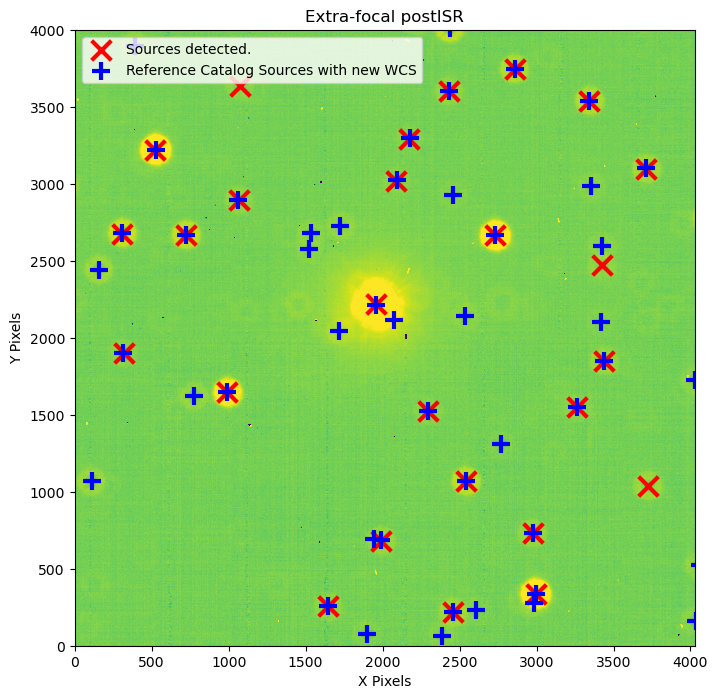

In [45]:
%matplotlib inline

fig=plt.figure(figsize=(8,8))

fig.add_subplot(1,1,1)
zscale_extra = ZScaleInterval().get_limits(postIsrExtra.image.array)
plt.imshow(postIsrExtra.image.array, norm=mpl.colors.AsinhNorm(vmin=zscale_extra[0], vmax=zscale_extra[1]), origin='lower')
plt.title('Extra-focal postISR')
plt.scatter(auxTelCat['centroid_x'], auxTelCat['centroid_y'], c='r', marker='x', lw=3, s=200, label="Sources detected.")
plt.scatter(srcX, srcY, c='blue', marker='+', s=150, lw=3, label="Reference Catalog Sources with new WCS")
plt.legend()
plt.xlabel('X Pixels')
plt.ylabel('Y Pixels')
plt.xlim(0, 4028)
plt.ylim(0, 4000)

The results look much better. The reference catalog sources nicely line up right on our detections!